# <center>Digital Image Processing - Problem Set 2</center>

### Student Names: Catherine Díaz & Sorelys Sandoval


### Instructions

This Problem Set covers the topics of Image enhancement in the spatial domain, power law transformations, histogram equalization, smoothing, median filters, image sharpening, Laplacian of an image, image gradients and Sobel operators. <br>

Your solutions to the following problems should include commented source code and a short description of each function. You should test your functions with several input images, besides the ones provided here. Include the input and output images that you used for experimentation. Analyze your results. If you discover something interesting, let us know!

In [2]:
# Import all the libraries needed
from os import listdir, path
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
filenames = listdir('images')

### Problem 1

Implement the code for the function below, which runs histogram equalization on a grayscale image. Your code should compute the histogram of the image, and use the cdf as a transformation function. The function should return the equalized image as an array. Use the function to do histogram equalization on the images <tt>darkPollen.jpg</tt>, <tt>lightPollen.jpg</tt>, <tt>lowContrastPollen.jpg</tt>, <tt>pollen.jpg</tt>, <tt>spine.jpg</tt> and <tt>runway.jpg</tt>. Include in the report plots and comparisons between the histograms of the corrected images to those of the originals. Also include a plot of the transformation function that equalizes the input histograms. Please comment your results.

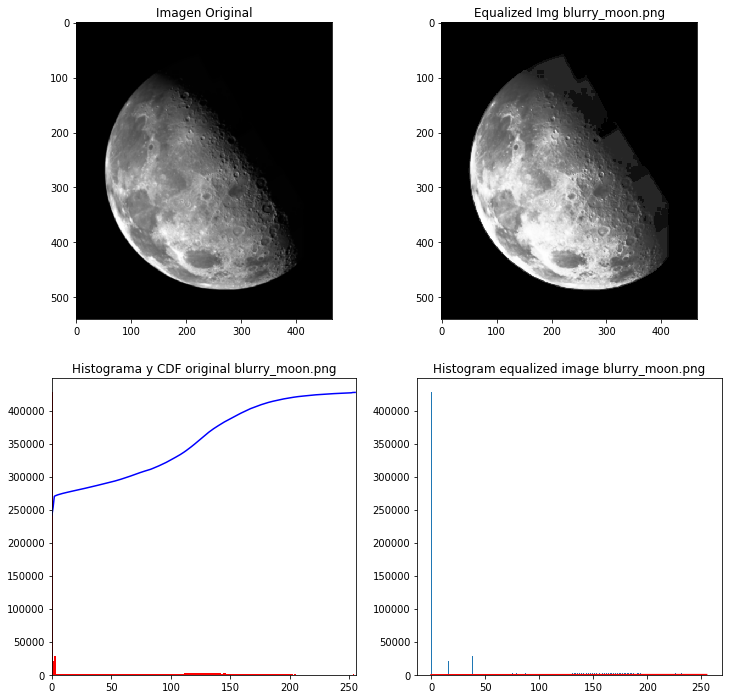

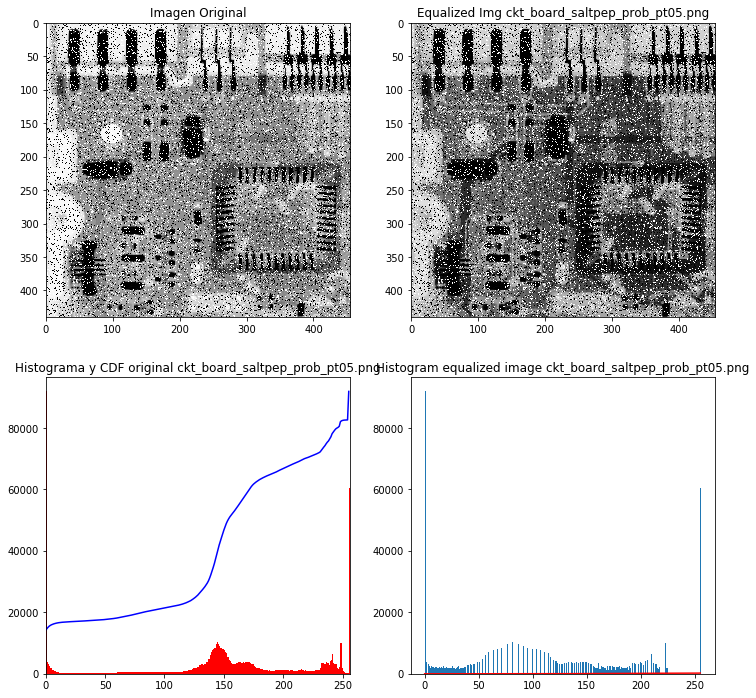

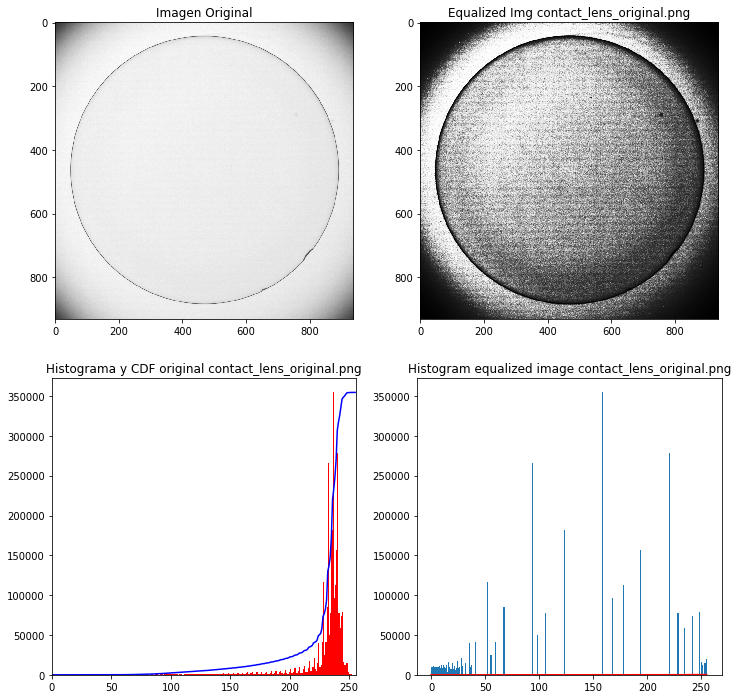

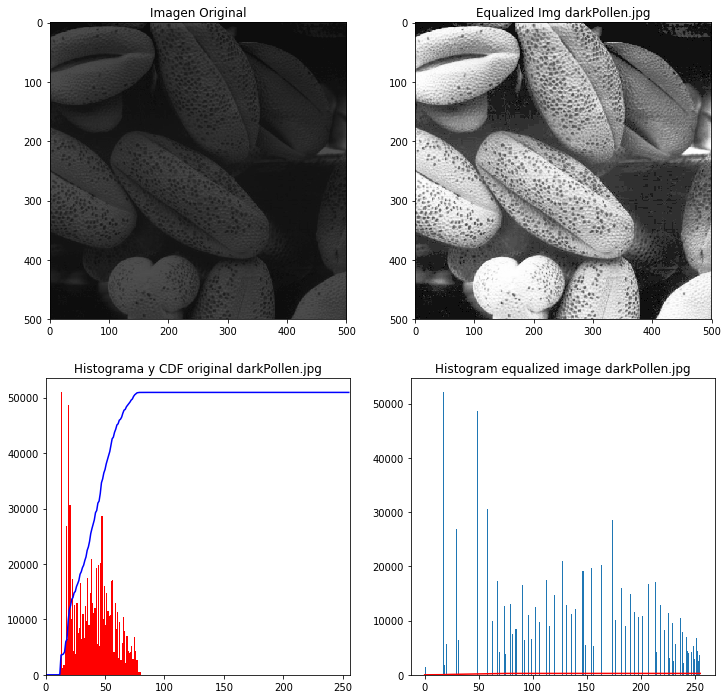

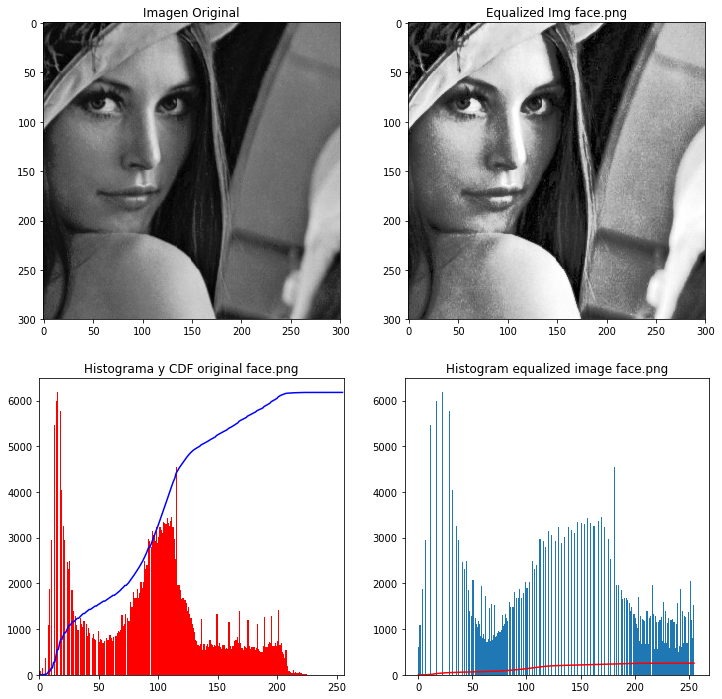

...

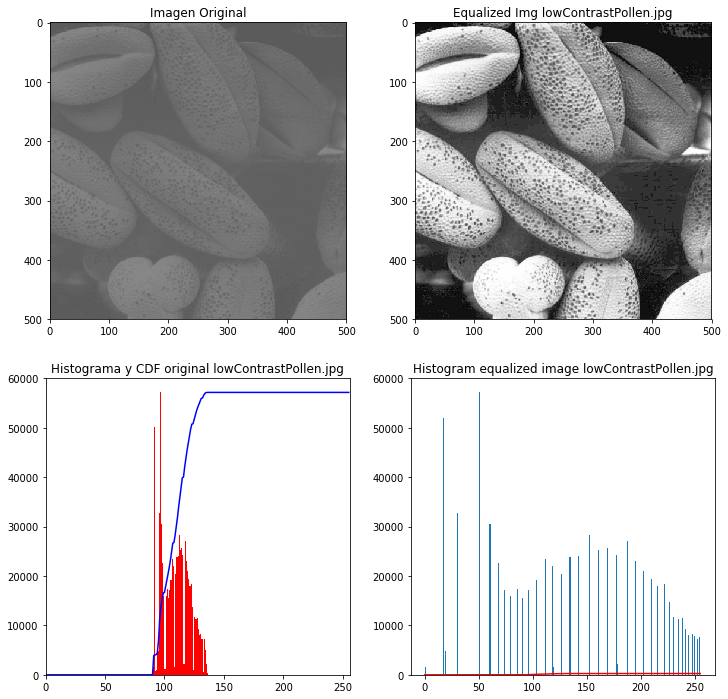

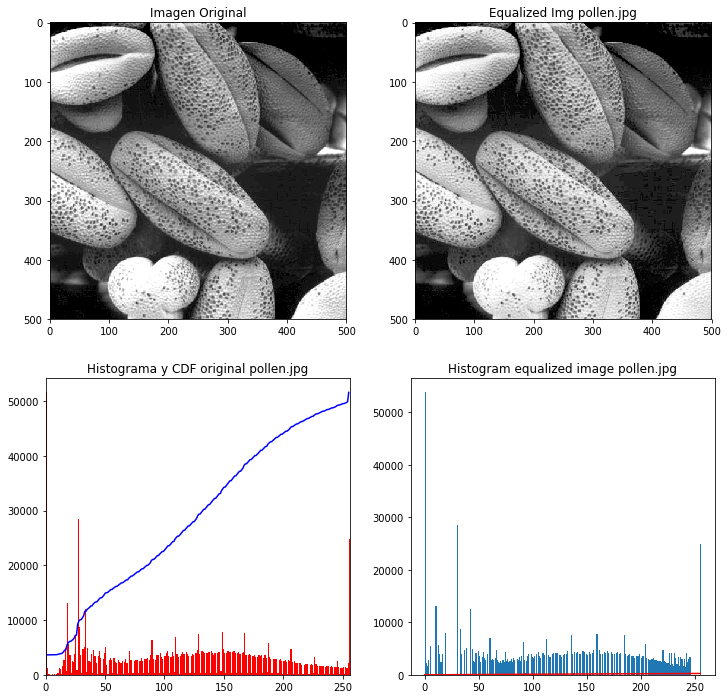

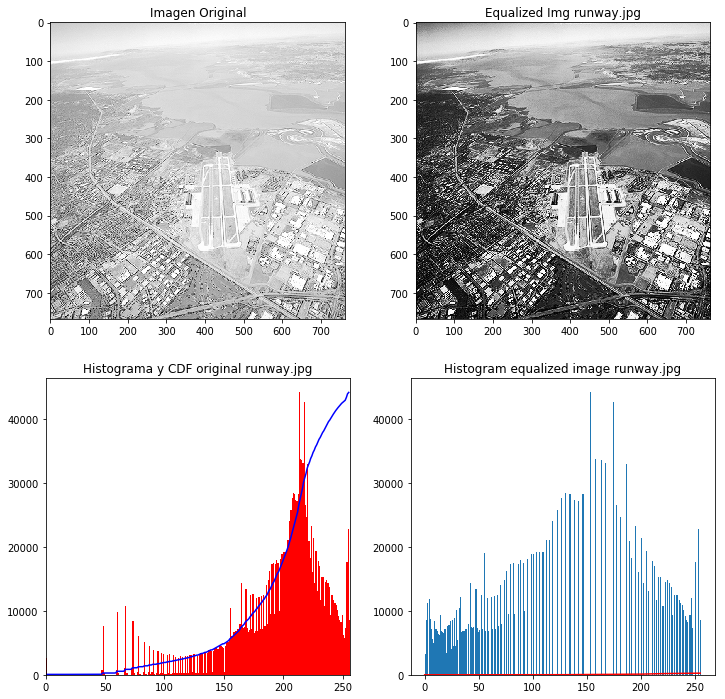

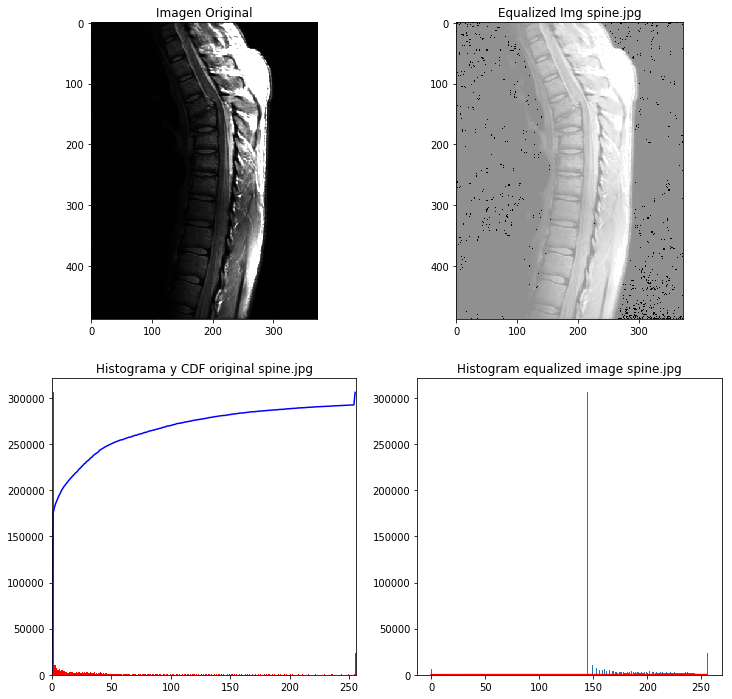

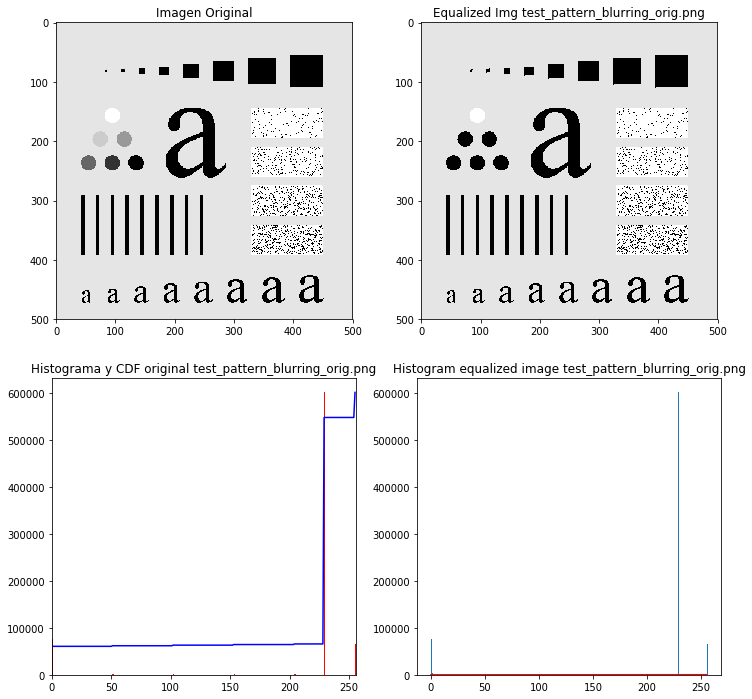

In [125]:
"""Function to obtain the cdf and the histogram of an image"""
def histcdf(imgf):
    hist,bins = np.histogram(imgf.flatten(),256,[0,256]); 
    cdf = hist.cumsum()
    """The type of data was changed because an overflow was ocurring and the operation 
    realized to normalize the cdf was not working well"""
    cdf = cdf.astype(np.int64) 
    """Normalization of the CDF to have it in the same "scale" as the images histograms' values"""
    cdf_normalized = (cdf * hist.max())/ cdf.max()  
    
    """Normalized cdf plotted in blue"""
    plt.plot(cdf_normalized, color = 'b')   
    """Normal histogram plotted in red"""
    plt.hist(imgf.flatten(),256,[0,256], color = 'r')
    plt.xlim([0,256])
    plt.title("Histogram & original CDF of"+name)
    
    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')
    """Returns the Equalized image and its CDF """
    return [cdf[img],cdf]

images = [] # List with all the images read
for i,name in enumerate(filenames):
    img = cv2.imread("images/"+name,1);
    plt.figure(figsize=(12,12));plt.subplot(2,2,1);plt.title("Original picture ");plt.imshow(img)
    plt.subplot(2,2,3);
    equa,cdfq=histcdf(img);

    plt.subplot(2,2,4)
    plt.plot(cdfq, color = 'r')  
    plt.hist(equa.flatten(),256,[0,256])
    plt.title("Equalized image histograme "+name)
    plt.subplot(2,2,2)
    plt.imshow(equa)
    plt.title("Equalized Img "+name)
plt.show();


<p><em><strong>Code functionality:</strong></em> An image has its histogram calculated and displayed. Then using the cdf the image and the histogram are transformed so that both of them are equalized. Then the new histogram and its histogram image are displayed. All this is contained in a loop that allows different images to go through this process.</p>
<p><em><strong>Functions used and description:</strong></em></p>
<p>The function <strong>np.histogram()</strong> takes as its first argument the image, which needs to be flattened first because the histogram function takes a one-dimensional array as input, and the function <strong>flatten()</strong> converts any array to an one-dimensional type of array with values taken row-wise, so it is used. The following argument is the number of bins. It represents the width of a single bar of the histogram along the X-axis. The next arguments are optional and is to tail the limit value to be represented in the histogram and the range that weighs samples.</p>
<p><strong>Hist.cumsum()</strong> performs the cumulative sum of the histogram content. It is necessary for plotting the CDF. The CDF is normalized by multiplying it with the histogram&rsquo;s maximum value and dividing it by its own maximum value, but before this operation due to an overflow that did not allow the code to work the way it had to, the type of the variable cdf had to be changed by using <strong>.asdtype(np.int64)</strong>. Finally, the normalized version is the one that is plotted in blue while the red one is the normal histogram.</p>
<p>The function <strong>np.ma.masked_equal() </strong>masks where the array given as its first argument is equal to second argument. In this case it masks the cdf where it is 0. This is done so that with a few operations the minimum value within the image (excluding 0 which was excluded) is found.</p>
<p>As the value each input pixel must take for output is known, the transformation is done when returning the values by writing cdf[img].</p>
<p><strong><em>Also:</em></strong> The equalization of the image distributes in a better way the values of the pixels, it is easier to understand numerically by looking at the histogram before and after. On the picture the changes are really noticeable too because they allow everything in the it to show up in a better way, so that everything is in a better light condition. It is really useful when the pixels in a picture are confined in a particular region of the histogram, so it adjusts the whole contrast of the image.</p>

### Problem 2

Implement the code for the function below which performs a power law transformation on an image. This function should take an image array and the gamma value to be used in the transformation as its only input parameters. The function should return a new image array which is the power transformation of the original image. Power law transformations are achieved using the following formula:
$$ g(x,y) = T[f(x,y)] = c \cdot f(x,y) ^ \gamma $$

where $g(x,y)$ is the output pixel value, $f(x,y)$ is the original pixel value, $\gamma$ is the parameter controlling the power law transformation and $c$ is a constant usually set to 1. Note that you convert the image so that the intensity values are in the range 0.0 – 1.0, rather than in 0 – 255.

Try this new function out on the images <tt>spine.jpg</tt> and <tt>runway.jpg</tt>, experimenting with different values for $\gamma$. Please comment your results.

spine.jpg


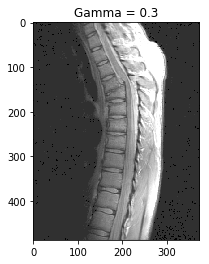

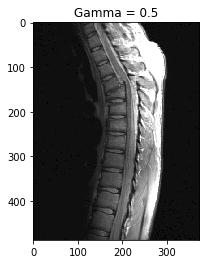

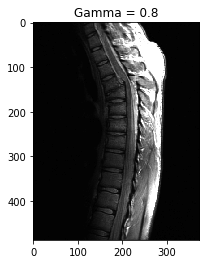

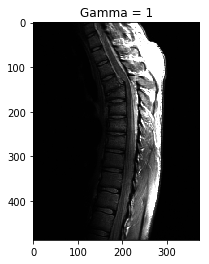

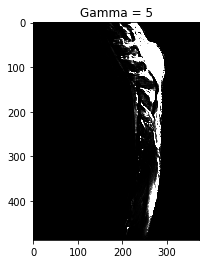

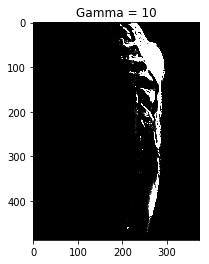

runway.jpg


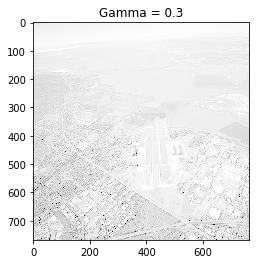

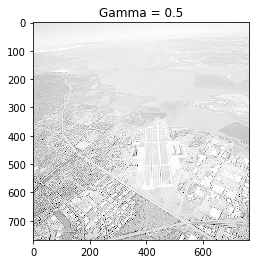

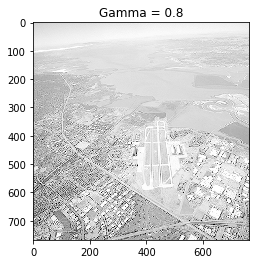

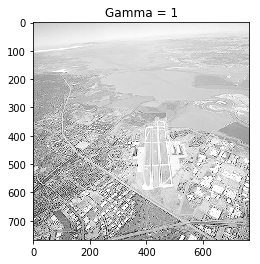

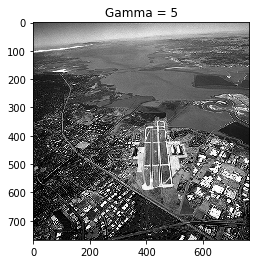

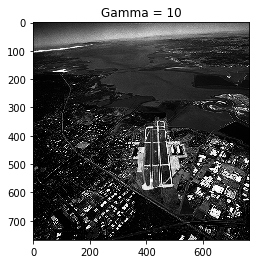

In [63]:
def pow_lt(image, gamma):
    """ Function that does the power law transformation on an image.
    Input:  image: numpy array with the image data.
    ======  gamma: value of gamma.
    
    Output: numpy array with the transformed image.
    ======
    """
    c = 1
    img_out = c * np.power(image/255.0,gamma)
    return (img_out*255).astype('int')

img_names = ["spine.jpg", "runway.jpg"]
for name in img_names:
    print name
    img = cv2.imread("images/"+name, cv2.IMREAD_GRAYSCALE)
    for y in [0.3,0.5,0.8,1,5,10]:
        plt.figure(); plt.imshow(pow_lt(img,y), cmap='gray'); plt.title("Gamma = "+str(y))
    plt.show()

<p><em><strong>Code functionality:</strong></em> An array of images are read. Then each is nomalized in order to make the transformation. The equation $$ g(x,y) = T[f(x,y)] = c \cdot f(x,y) ^ \gamma $$ is applied and the image is denormalized.</p>
<p><em><strong>Functions used and description:</strong></em></p>
<p>The behavior of the function is coherent with the equation that is a power function<a href"http://www.pyimagesearch.com/2015/10/05/opencv-gamma-correction/">(1)</a> <a href"https://en.wikipedia.org/wiki/Gamma_correction">(2)</a>.
This could be sumarize in:
<li>When the gamma values are less than 1, the output image will be brighter than the input image.
<li>When gamma is greater than 1, the output image will be darker.
<li>When the gamma is equal to the unit, the output image will be the same input image.</li>

For both images is remarkable that some details appeared after some values of gamma, $\gamma=0.8$ for the spine and $\gamma=5$ for the runway image. That is way this transformation is important because it can show parts of the image that could not be seen before because of a wrong gamma calibration.

### Problem 3

Implement a function that performs smoothing on an input image with an averaging filter mask of size $n$. The function should take two inputs: an image matrix and the filter size $n$. Use the image <tt>test_pattern_blurring_orig.tif</tt> to test your algorithm. Use averaging filter masks of sizes $n = 3, 5, 9, 15, 35$. Analyze the results you obtained.

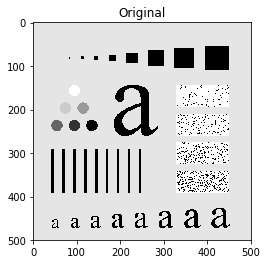

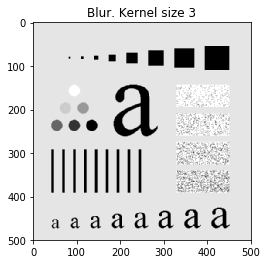

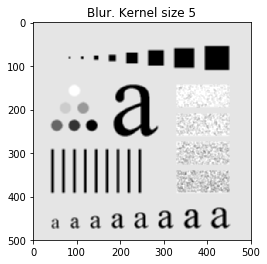

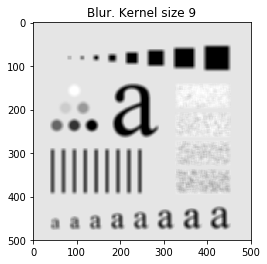

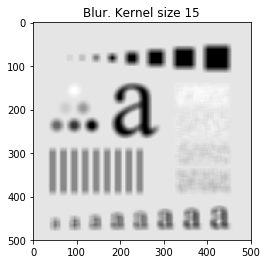

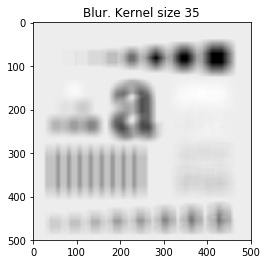

In [171]:
"""Fucntion to blur or smooth the image"""
def smooth1(image, n):
    im1=cv2.blur(image,(n,n))
    return im1


img = cv2.imread("images/test_pattern_blurring_orig.png", cv2.IMREAD_GRAYSCALE)
fig = plt.figure();
plt.imshow(img, cmap='gray')
plt.title("Original")
plt.show()

"""Loop that defines the change of the kernel size used in the image modification"""
for i in [3, 5, 9, 15, 35]:
    img3 = smooth1(img,i)
    plt.imshow(img3, cmap = 'gray')
    plt.title("Blur. Kernel size " + str(i)) 
    plt.show()
  

<p><em><strong>Code functionality:</strong></em>A function gets an image modified with a blurring filter. The original image and the blurred results are displayed. Several results are obtained because this process is inside of a cycle which gets it done for several kernel sizes.</p>
<p><em><strong>Functions used and description:</strong></em></p>
<p>The function <strong>cv2.blur()</strong> basically convolves the image with a normalized box filter, which causes its smoothing by averaging the pixels under the kernel and replacing the central element with that average.</p>
<p><strong><em>Keep in mind:</em></strong> There are other functions that are supposed to perform the same way, like cv2.boxFilter.</p>

### Problem 4

Consider the image <tt>ckt_board_saltpep_prob_pt05.png</tt>. It has been corrupted with ‘salt-and-pepper’ noise (more formally known as impulse noise). Try to remove the noise from this image by applying a median filter of size 3x3. Compare the result to applying an averaging filter of size 3x3.  Increase the kernel size to 3x3, 5x5, 9x9, 15x15 and repeat. Analyze the results you obtained. Did the filter successfully remove the noise? Did you observe any other side effects?

You can also corrupt any image you like with a salt-and-pepper noise generator. Write another function which adds salt-and-pepper noise to an input image. Use that function to corrupt additional images. Try to recover the original images using a median filter of appropriate size.

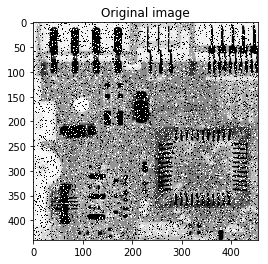

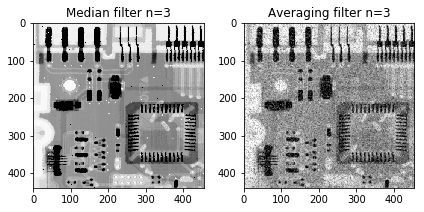

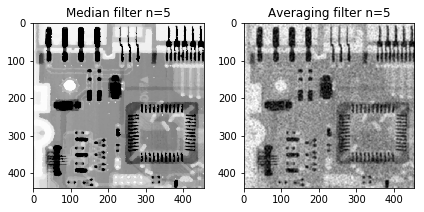

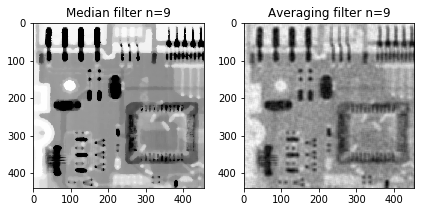

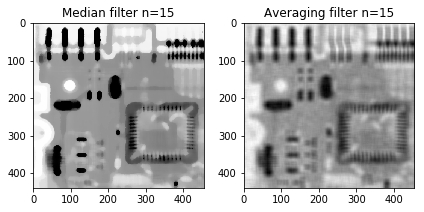

In [11]:
def noise_gen(image,percent):
    """ Function that generates a salt and pepper noise on an image.
    Input:  image: numpy array with the image data.
    ======  percent: percent of noisy data.
    
    Output: numpy array with the transformed image.
    ======
    """
    out = image.copy()
    percent = percent/100.0
    cant = int(percent/2 * image.size)
    pointsS = [np.random.randint(0, i - 1, cant) for i in image.shape]
    out[pointsS] = 255 #Salt
    pointsP = [np.random.randint(0, i - 1, cant) for i in image.shape]
    out[pointsP] = 0 #Pepper
    return out

def medianFilter(image,n):
    """ Function that filters an image using a median filter.
    Input:  image: numpy array with the image data.
    ======  n: integer, size of the kernel.
    
    Output: numpy array with the filtered image.
    ======
    """
    return cv2.medianBlur(image,n)

def avgFilter(image,n):
    """ Function that filters an image using a averaging filter.
    Input:  image: numpy array with the image data.
    ======  n: integer, size of the kernel.
    
    Output: numpy array with the filtered image.
    ======
    """
    return cv2.blur(image,(n,n))

img_names = ["ckt_board_saltpep_prob_pt05.png", "100_dollars.tif","dog.jpg"]
img = cv2.imread("images/"+img_names[0], cv2.IMREAD_GRAYSCALE)
plt.figure(); plt.imshow(img, cmap='gray'); plt.title('Original image'); plt.show();
for n in [3,5,9,15]:
    fig = plt.figure();
    plt.subplot(1,2,1); plt.imshow(medianFilter(img,n), cmap='gray'); plt.title('Median filter n='+str(n));
    plt.subplot(1,2,2); plt.imshow(avgFilter(img,n), cmap='gray'); plt.title('Averaging filter n='+str(n));
    fig.tight_layout()
    plt.show()

100_dollars.tif


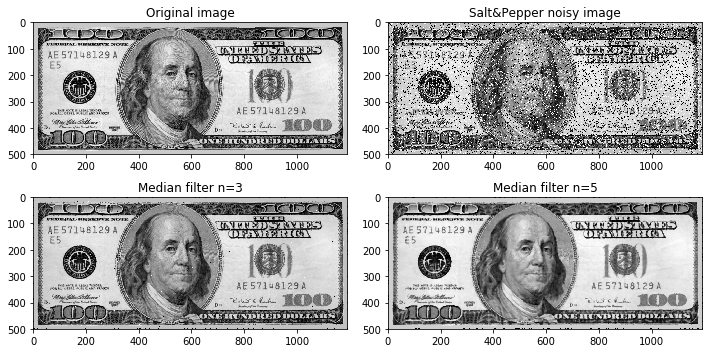

dog.jpg


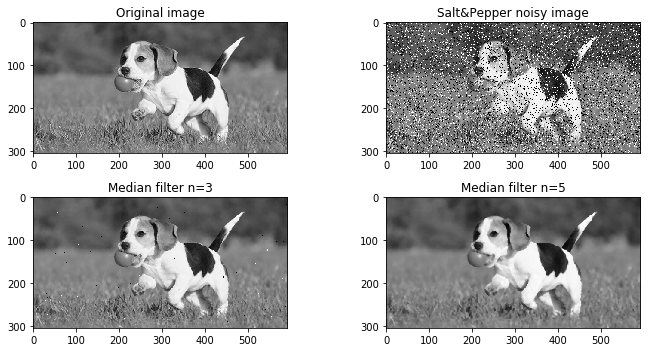

In [12]:
for name in img_names[1:]:
    print name
    img = cv2.imread("images/"+name, cv2.IMREAD_GRAYSCALE)
    fig = plt.figure(figsize=(10,5));
    plt.subplot(2,2,1); plt.imshow(img, cmap='gray'); plt.title('Original image');
    img_n = noise_gen(img,20)
    plt.subplot(2,2,2); plt.imshow(img_n, cmap='gray'); plt.title('Salt&Pepper noisy image');
    plt.subplot(2,2,3); plt.imshow(medianFilter(img_n,3), cmap='gray'); plt.title('Median filter n=3');
    plt.subplot(2,2,4); plt.imshow(medianFilter(img_n,5), cmap='gray'); plt.title('Median filter n=5');
    fig.tight_layout()
    plt.show()

<p><em><strong>Code functionality:</strong></em>Two functions try to clear a noisy image with an averaging and a median filter. The original image and the blurred results are displayed. Several results are obtained because this process is inside of a cycle which gets it done for several kernel sizes. After this, a function adds a salt and pepper noise to a group of images and then it will be removed with different sizes of median filters</p>
<p><em><strong>Functions used and description:</strong></em></p>
<p>The function <strong>cv2.medianBlur()</strong> <a href="http://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html#void medianBlur(InputArray src, OutputArray dst, int ksize)">(1)</a> basically takes median of all the pixels under kernel area and central element is replaced with this median value. For the averaging filter was used the function <strong>cv2.blur()</strong> which was explained previously.</p>
<p>To develop the noise generator, it was used the function <strong>np.random.randint(a,b,c)</strong> whose output is a random array of integers in the range [a,b) with length=c. This was used to get random indexs of the image matrix in order to make them 0 or 255 (pepper or salt respectively) <a href="http://stackoverflow.com/questions/22937589/how-to-add-noise-gaussian-salt-and-pepper-etc-to-image-in-python-with-opencv">(The code is based on this link)</a>. The quatity of pepper or salt (c) is the half of the input noise percent by the number of pixels in the matrix image.

<p>Comparing the median versus the averaging filter, it is more accurate the median filter when the noise is similar to the salt and pepper noise. The averaging filter maintains the black and white points and blurs the whole image but the median filter seems to remove the noise. However when the kernel size is bigger, the output image will be more blurred.
<p>After trying with different kernel sizes, images and percent of noise, the kernel sizes that we considered the most accurate are n=3 and n=5, because they remove most of the noise but keep most of the details. The examples shown are of images with 20% of salt and pepper noise.

### Problem 5 

`1. Write a function that sharpens an image using the Laplacian kernel. Your function should first compute the Laplacian of the input image using the following kernel:
<table>
<tr>
<td>0</td>
<td>1</td>
<td>0</td>
</tr>
<tr>
<td>1</td>
<td>-4</td>
<td>1</td>
</tr>
<tr>
<td>0</td>
<td>1</td>
<td>0</td>
</tr>
</table>

2. Visualize the Laplacian of the input image. You may consider using a power intensity transformation to enhance the Laplacian image for visualization.

3. Recall that sharpening is achieved by subtraction: $g(x,y) = f(x,y) - \nabla^2 f(x,y) $. Use this method to produce an enhanced image.

4. Recall that subtraction and filtering with a kernel are linear operations. Therefore, it is possible to combine both operations into a single kernel:
<table>
<tr>
<td>0</td>
<td>-1</td>
<td>0</td>
</tr>
<tr>
<td>-1</td>
<td> 5</td>
<td>-1</td>
</tr>
<tr>
<td>0</td>
<td>-1</td>
<td>0</td>
</tr>
</table>
Write another function that directly sharpens the image using this single kernel.

5. Finally, recall that there is an alternative kernel that can be used to compute a Laplacian: 
<table>
<tr>
<td>1</td>
<td>1</td>
<td>1</td>
</tr>
<tr>
<td>1</td>
<td> -8</td>
<td>1</td>
</tr>
<tr>
<td>1</td>
<td>1</td>
<td>1</td>
</tr>
</table>
Write another function that produces a sharpened image using a single enhancement kernel that is based on this alternative definition of the Laplacian.

Apply all the functions you wrote to the image <tt>blurry_moon.png</tt>. Compare, analyze and comment all the results. You are also encouraged to try out your functions on more testing images.

blurry_moon.png


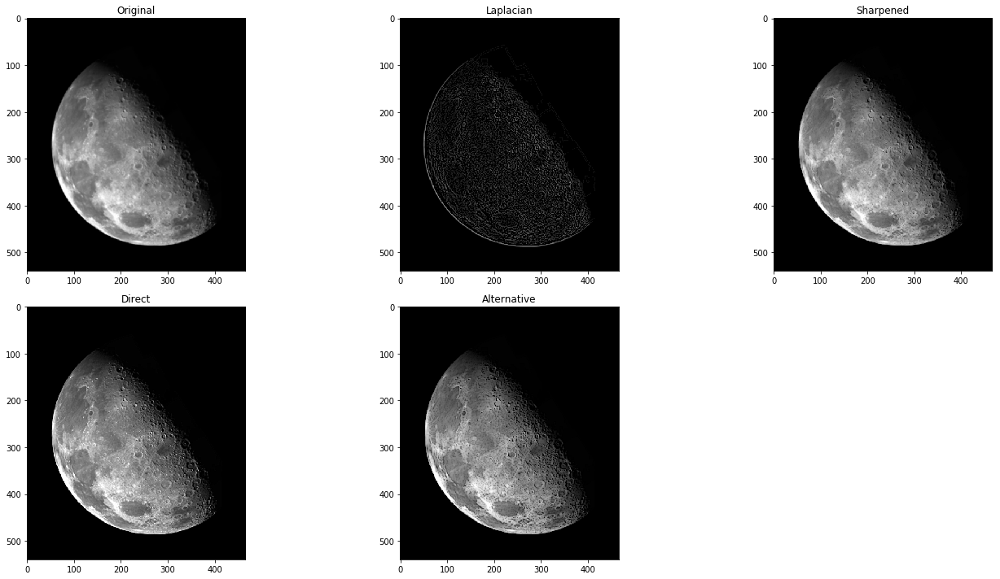

car.png


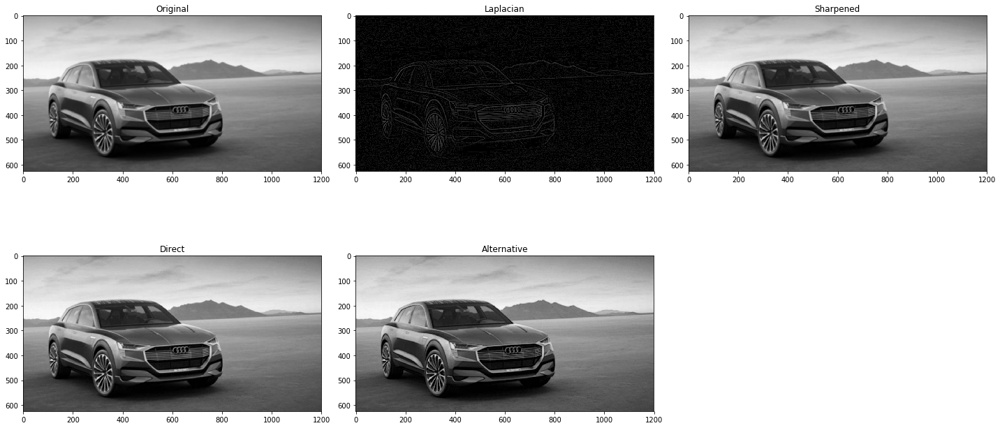

blurry_cat.png


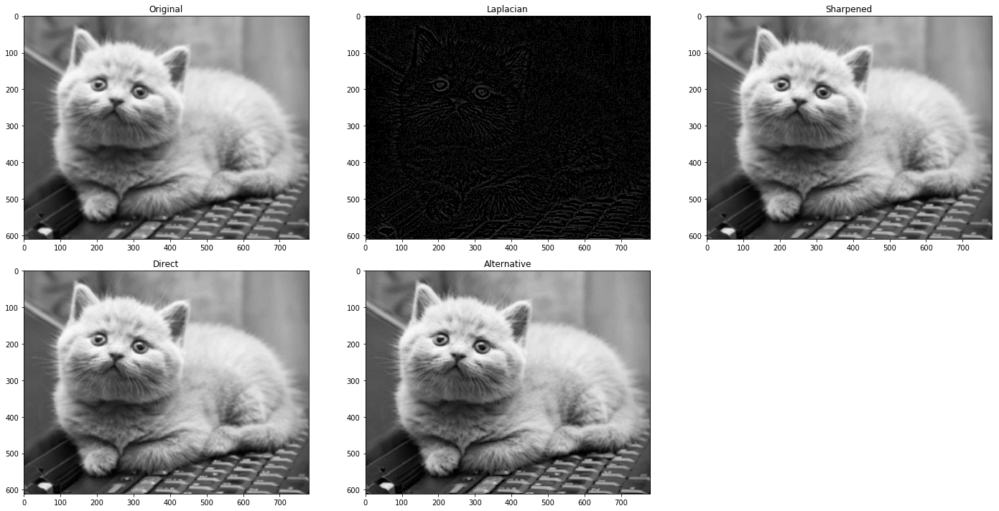

In [60]:
import functools
plt.bwimshow = functools.partial(plt.imshow, vmin=0, vmax=255)

def laplacian(image, kernel):
    """ Function that filters an image using a laplacian filter.
    Input:  image: numpy array with the image data.
    ======  n: integer, size of the kernel.
    
    Output: output: numpy array with the filtered image.
    ======
    """
    output = cv2.filter2D(image, -1,kernel.astype(float))
    return np.abs(output).astype('int')

def directSharpen5(image):
    """ Function that sharps an image using the kernel [[0, -1, 0], [-1, 5, -1], [0, -1, 0]].
    Input:  image: numpy array with the image data.
    ====== 
    
    Output: numpy array with the sharpened image.
    ======
    """
    return laplacian(image, np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]))

def altSharpen8(image):
    """ Function that sharps an image using a laplacian filter with the alternative kernel [[1, 1, 1], [1, -8, 1], [1, 1, 1]].
    Input:  image: numpy array with the image data.
    ====== 
    
    Output:   out: numpy array with the sharpened image.
    ======
    """
    out1 = laplacian(image,np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]]))
    out = np.subtract(image,out1)
    return out

img_names = ["blurry_moon.png", "car.png","blurry_cat.png"]

for name in img_names:
    print name
    img = cv2.imread("images/"+name, cv2.IMREAD_GRAYSCALE)
    img_1 = laplacian(img, np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]))
    img_2 = np.subtract(img,img_1)
    fig = plt.figure(figsize=(20,10));
    plt.subplot(2,3,1); plt.bwimshow(img, cmap='gray'); plt.title('Original');
    plt.subplot(2,3,2); plt.bwimshow(pow_lt(img_1,0.5), cmap='gray'); plt.title('Laplacian'); 
    plt.subplot(2,3,3); plt.bwimshow(img_2, cmap='gray'); plt.title('Sharpened');
    plt.subplot(2,3,4); plt.bwimshow(directSharpen5(img), cmap='gray'); plt.title('Direct'); 
    plt.subplot(2,3,5); plt.bwimshow(altSharpen8(img), cmap='gray'); plt.title('Alternative'); 
    fig.tight_layout()
    plt.show()

<p><em><strong>Code functionality:</strong></em> An image is filtered by a laplacian filter and then sharpened by subtracting itself minus the filtered image obtained before. This is made for two given kernels. Another sharpened image is obtained by doing the convolution of the original image and another given kernel. The original image and the sharpened results are displayed. All this is contained in a loop that allows different images to go through this process.</p>
<p><em><strong>Functions used and description:</strong></em></p>
<p>The function <strong>cv2.filter2D()</strong> convolves a specified kernel with an image
<a href="http://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html#void filter2D(InputArray src, OutputArray dst, int ddepth, InputArray kernel, Point anchor, double delta, int borderType)">(1)</a> It is important to indicate the type of data as float in order to get a high resolution of the covolution and most important to get the possible negative values that this operation generates. At the end the whole matrix will be returned to integer but making positive the negative pixels before.</p>

<p>The function <strong>functools.partial()</strong> allows user to custumize built functions. In this case it fixes the function plt.imshow() which auto-adjusts its range to the min and max of the data, but the output the laplacian function has max values less than 255 and its plot using imshow did not represent the actual values of the laplacian. Besides it was used the function of the second problem to enhance the visualization of the filtered image.

<p>Comparing the results of using the subtraction versus the kernel with center 5, they are quite alike. The alternative kernel seems to have a better performance. For example in the cat's image the eyes are more sharpened than the ones using the first kernel. This might be due to the non-zero corners of the kernel.
The additional images were previously modified; the car image has less blur than the cat image.

<p><strong><em>Keep in mind:</em></strong> There are other functions that are supposed to perform almost the same way as laplacian, like <a href="http://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html#cv2.Laplacian">cv2.Laplacian</a> but we did not use it because it is more dificult to custumize the kernel.</p>

## Problem 6

The gradient of an image is the two-dimensional vector

$\nabla \mathbf{f} = \left[ \begin{array}{c}G_x\\G_y\end{array} \right] 
=\left[ \begin{array}{c}\frac{\partial f}{\partial x}\\ \frac{\partial f}{\partial y} \end{array} \right]
$

1. Write a function that calculates the image gradients in the $x$ and $y$ directions. Use the following Sobel operators to compute the derivatives:
<table>
<tr>
<td>-1</td>
<td>-2</td>
<td>-1</td>
</tr>
<tr>
<td>0</td>
<td>0</td>
<td>0</td>
</tr>
<tr>
<td>1</td>
<td>2</td>
<td>1</td>
</tr>
</table>
<table>
<tr>
<td>-1</td>
<td>0</td>
<td>1</td>
</tr>
<tr>
<td>-2</td>
<td>0</td>
<td>2</td>
</tr>
<tr>
<td>-1</td>
<td>0</td>
<td>1</td>
</tr>
</table>
The function should output two variables, $G_x$ and $G_y$, which correspond to the derivatives in the $x$ and $y$ directions. Visualize the resulting gradients. Analyze the results obtained. How can you interpret the gradient operators?

2. Write another function that computes the gradient magnitude of an image. Recall that the magnitude of the gradient vector can be computed by:<br>
$\nabla f = \text{mag}(\nabla \mathbf{f}) = \left[ G_x^2 + G_y^2 \right]^\frac{1}{2}$.

3. Write another function that computes an approximation of the gradient magnitude using the following equation: <br>
$\nabla f \approx |G_x| + |G_y|$. <br>
Visualize and compare the resulting gradient magnitudes computed using both methods. How can you interpret the gradient magnitude?

You may use the images <tt>contact_lens_original.png</tt> and <tt>face.png<tt> to test your algorithms.


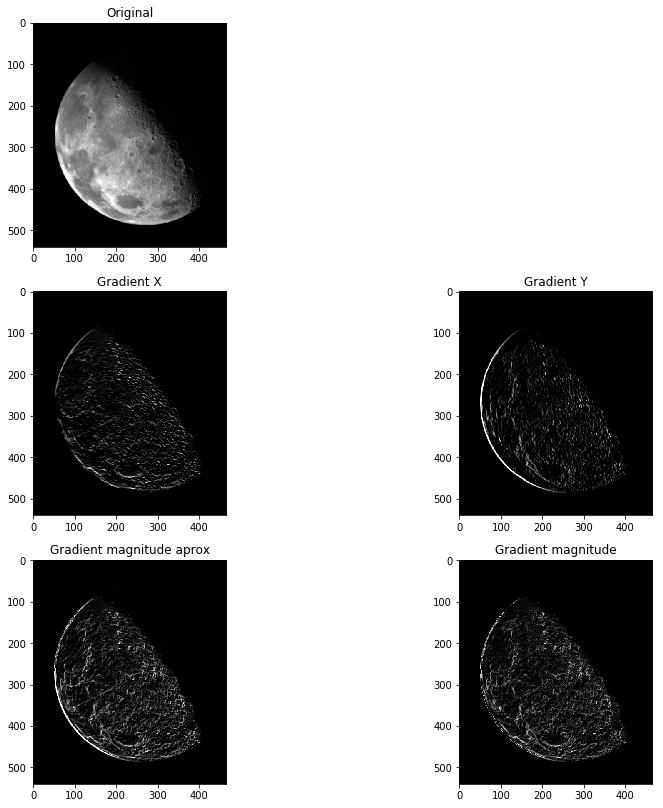

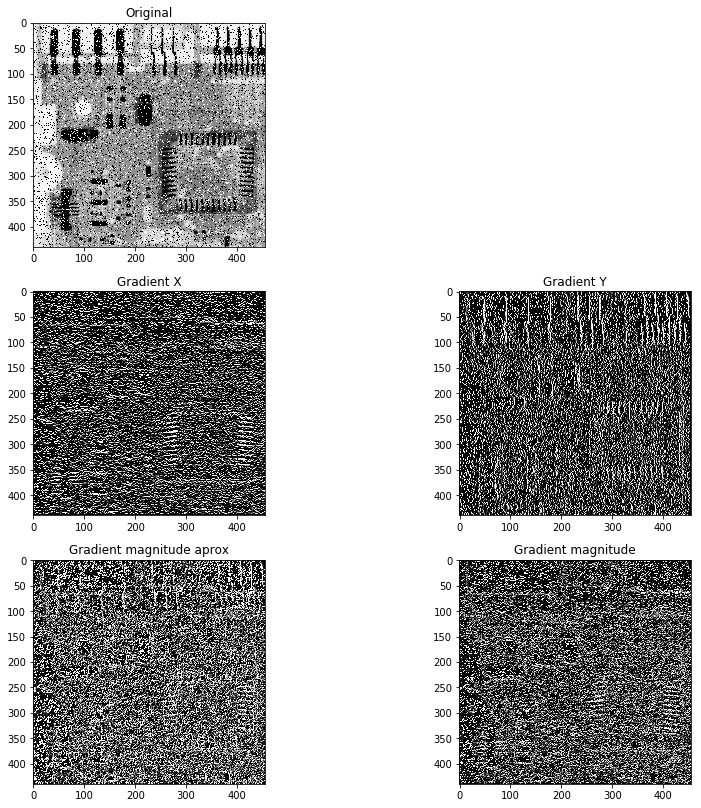

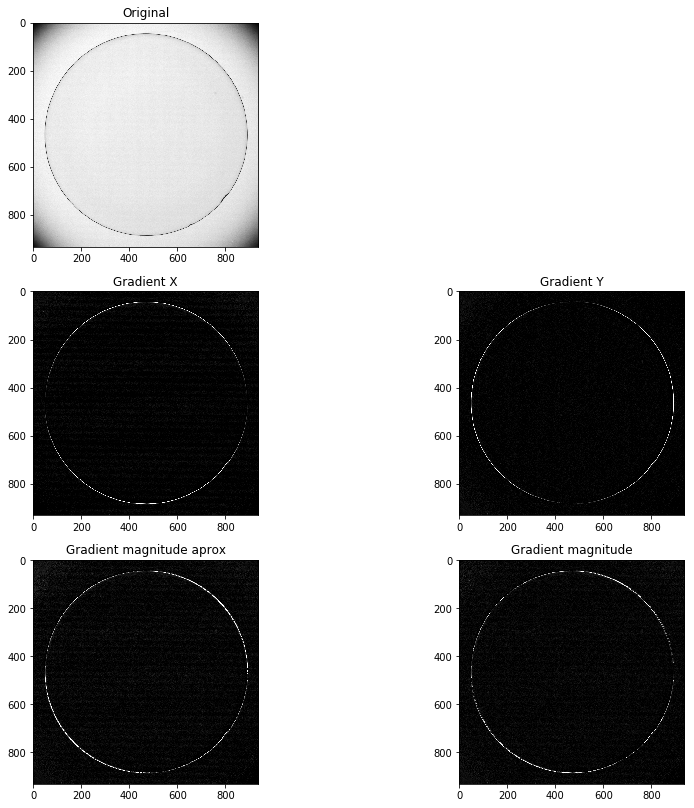

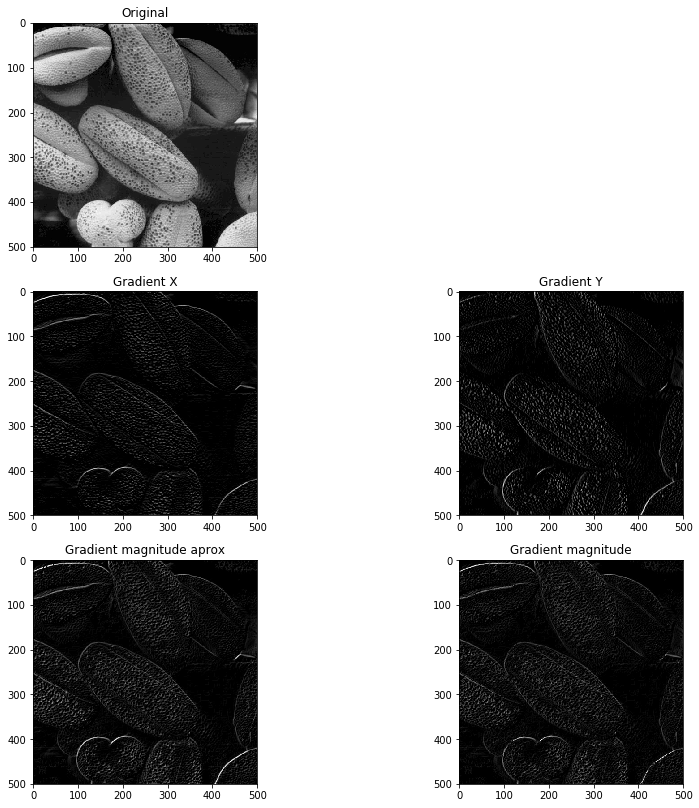

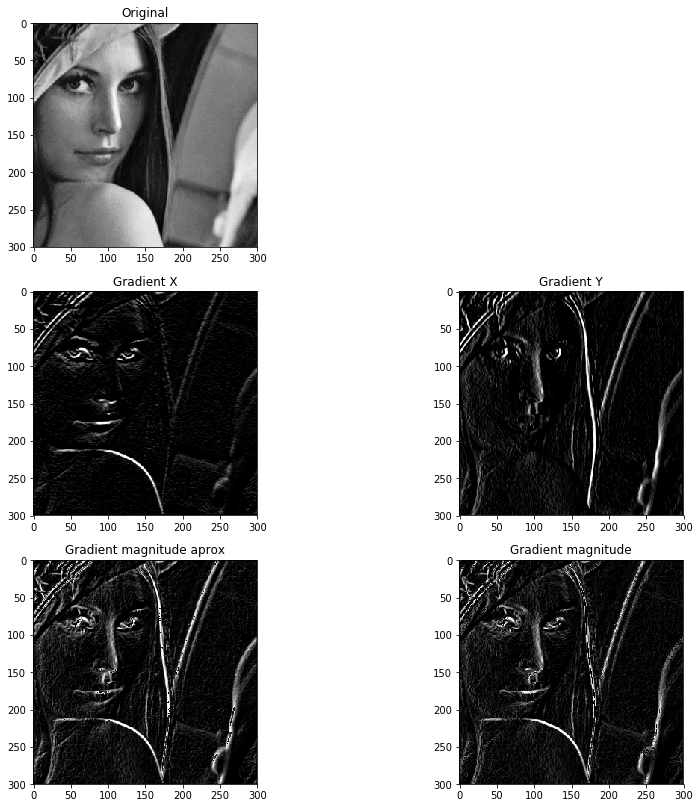

...

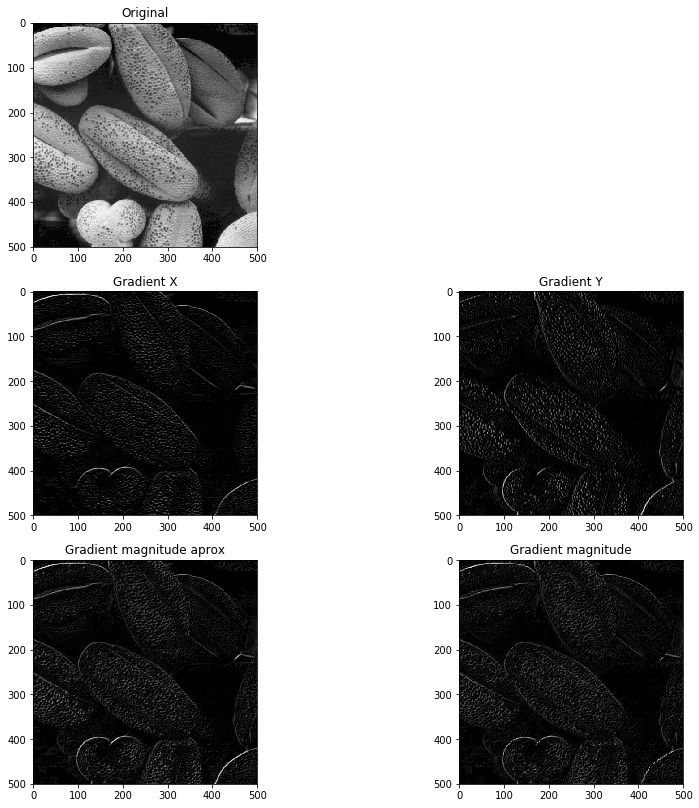

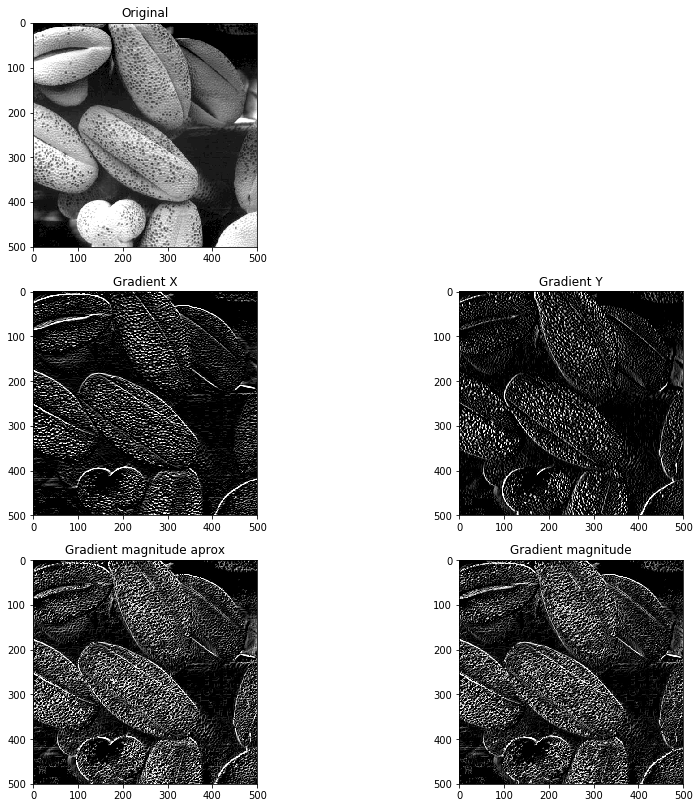

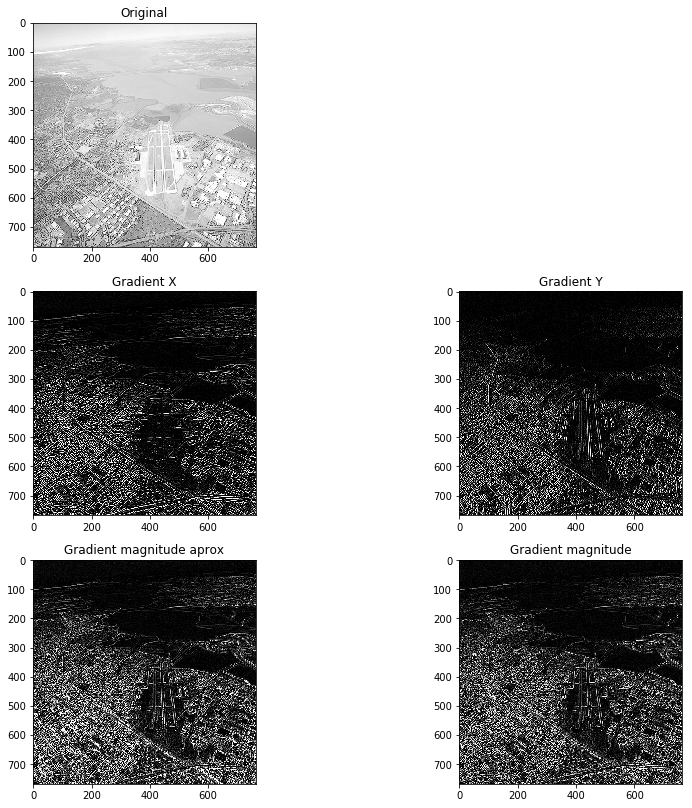

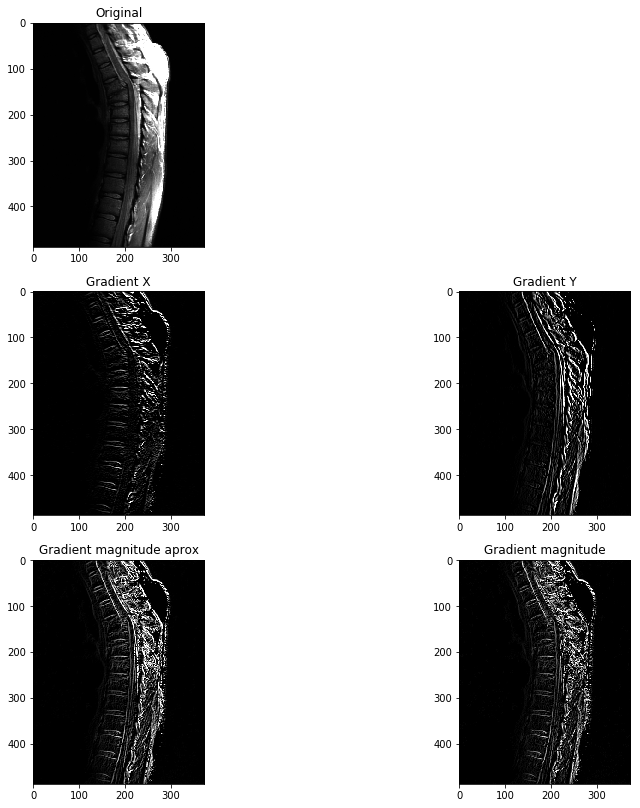

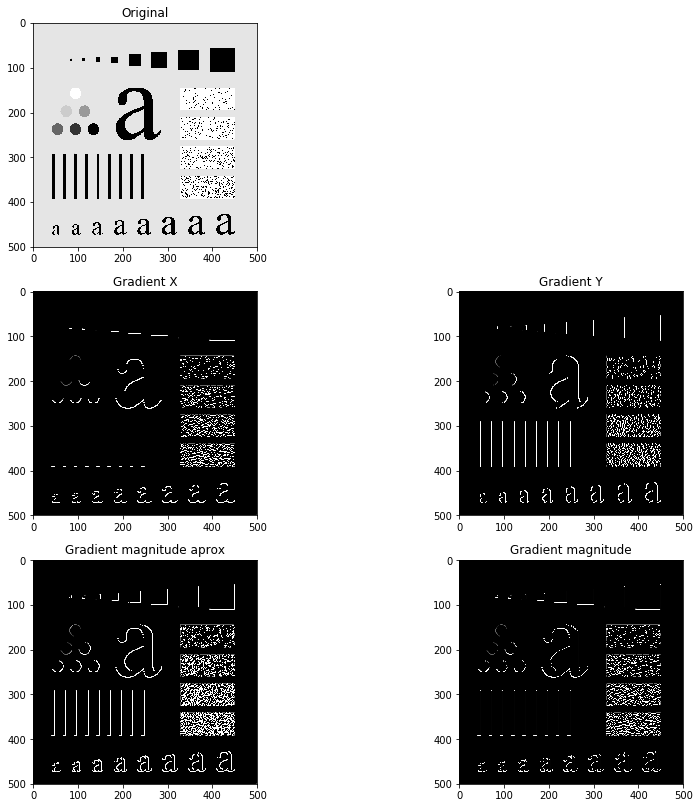

In [13]:
"""Function containing all the filters and operations needed for the gradients and magnitude"""
def sobel(img):
    """Defining the kernels needed for the filter to behave like a sobel filter """
    sobelx=np.array([[-1, -2, -1],[0, 0, 0], [1, 2, 1]])
    sobely=np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    """Getting the gradient in each axis with s "sobel filter" """
    gx=cv2.filter2D(img,-1,sobelx)
    gy=cv2.filter2D(img,-1,sobely)
    """Getting the aproximation of the gradient magnitude """
    maggrad = np.absolute(gx) + np.absolute(gy)
    """Getting the gradient magnitude  """
    grad =  (gx^2+gy^2)^(1/2)
    return [maggrad,grad,gx,gy]

for i,name in enumerate(filenames):
    img = cv2.imread("images/"+name, cv2.IMREAD_GRAYSCALE)
    fig = plt.figure(figsize=(14,14));
    plt.subplot(3,2,1)
    plt.imshow(img,cmap='gray'), plt.title("Original")
   
    [maggra,amano,gx,gy]=sobel(img)
    
    plt.subplot(3,2,3),plt.imshow(gx,cmap = 'gray')
    plt.title('Gradient X')
    plt.subplot(3,2,4),plt.imshow(gy,cmap = 'gray')
    plt.title('Gradient Y')
    plt.subplot(3,2,5),plt.imshow(maggra,cmap = 'gray')
    plt.title('Gradient magnitude aprox')
    plt.subplot(3,2,6),plt.imshow(amano,cmap= 'gray')
    plt.title('Gradient magnitude')
plt.show()

<p><em><strong>Code functionality:</strong></em>A loop gets several images to be modified by a function. In it sobel filters are used for the X and Y axis, so that the gradients in each direction are obtained and then displayed. Also in the function the gradient magnitude and an approximation of the gradient magnitude are obtained with python functions and a few mathematical operations.</p>
<p><em><strong>Functions used and description:</strong></em></p>
<p>The function <strong>cv2.filter2D()</strong> convolves a specified kernel with an image. Depending on the kernel that is defined the result can vary from an averaging filter to a sobel filter. In this case the kernels given to the function are the ones shown in the theory to make the sobel filters, first for x and then for y.</p>
<p>The approximation of the gradient magnitude is obtained by using the function <strong>np.absolute(). </strong>When the function receives only an argument it gets its absolute value. That is what is just needed from gx and gy to add them and obtain as it was just mentioned the approximation of the gradient magnitude</p>
<p><strong><em>Curious fact:</em></strong> A sobel function does already exist in the libraries, but its results have too much noise so it was chosen not to use it. Instead as previously mentioned the needed kernels were written and applied to the image by employing another function.</p>
<p>Also in the end it is reflected that the image resulting from the approximation of the gradient magnitude has more noise than the one resulting from the actual gradient magnitude. Even though the first one as well as the noise, seems to have some more details that are not included in the second one.</p>